In [1]:
import os
import sys
import h5py
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_context("notebook", font_scale=1.5)
sns.set_style("darkgrid", {'axes.grid' : False})   

%matplotlib inline

In [2]:
drive_path = '/Volumes/Brain2016 1/'

In [3]:
from allensdk.core.brain_observatory_cache import BrainObservatoryCache

manifest_path = os.path.join(drive_path,'BrainObservatory','manifest.json')
boc = BrainObservatoryCache(manifest_file=manifest_path)

### get metrics for all cell_specimens in the dataset

In [4]:
#get cell metrics dataframe
cell_specimen_df = pd.DataFrame(boc.get_cell_specimens(ids=None,experiment_container_ids=None))
cell_specimen_df.head()

,area,cell_specimen_id,dsi_dg,experiment_container_id,imaging_depth,osi_dg,osi_sg,p_dg,p_ns,p_sg,...,pref_sf_sg,pref_tf_dg,time_to_peak_ns,time_to_peak_sg,tld1_id,tld1_name,tld2_id,tld2_name,tlr1_id,tlr1_name
0,VISpm,517394843,NaN,511498500,275,NaN,0.728590,NaN,2.644073e-05,0.000076,...,0.32,NaN,0.29925,0.19950,177839004,Cux2-CreERT2,177837320,Camk2a-tTA,265943423,Ai93(TITL-GCaMP6f)
1,VISpm,517394850,NaN,511498500,275,NaN,0.899272,NaN,3.568235e-04,0.056579,...,0.32,NaN,0.43225,0.56525,177839004,Cux2-CreERT2,177837320,Camk2a-tTA,265943423,Ai93(TITL-GCaMP6f)
2,VISpm,517394858,0.592835,511498500,275,1.150344,NaN,0.002900,NaN,NaN,...,NaN,8.0,NaN,NaN,177839004,Cux2-CreERT2,177837320,Camk2a-tTA,265943423,Ai93(TITL-GCaMP6f)
3,VISpm,517394866,0.599360,511498500,275,0.745139,NaN,0.000004,NaN,NaN,...,NaN,8.0,NaN,NaN,177839004,Cux2-CreERT2,177837320,Camk2a-tTA,265943423,Ai93(TITL-GCaMP6f)
4,VISpm,517394870,NaN,511498500,275,NaN,0.599881,NaN,3.334354e-07,0.067868,...,0.02,NaN,0.23275,0.39900,177839004,Cux2-CreERT2,177837320,Camk2a-tTA,265943423,Ai93(TITL-GCaMP6f)


### get experiment containers meeting certain criteria

In [18]:
#get experiment_containers meeting certain criteria
expts = boc.get_ophys_experiments(targeted_structures=['VISl'],cre_lines=['Cux2-CreERT2'],
                                  imaging_depths=[275],session_types=['three_session_A'])
expts = pd.DataFrame(expts)
print len(expts),'experiments meet these criteria'
expts.head()

3 experiments meet these criteria


,age_days,cre_line,experiment_container_id,id,imaging_depth,session_type,targeted_structure
0,108.0,Cux2-CreERT2,511510945,507990552,275,three_session_A,VISl
1,101.0,Cux2-CreERT2,511510870,509958730,275,three_session_A,VISl
2,106.0,Cux2-CreERT2,511510848,506823562,275,three_session_A,VISl


In [19]:
#get experiment session id for the first experiment container
session_id = expts.id.values[0]
print session_id

507990552


### get data_set for one experiment session

In [20]:
#get data for a single experiment session
data_set = boc.get_ophys_experiment_data(ophys_experiment_id = session_id)

In [21]:
#get all cell_specimen_ids in this session
cell_specimen_ids = data_set.get_cell_specimen_ids()
print cell_specimen_ids[:10]

[517510374 517514372 517512878 517512894 517510358 517512739 517514066
 517512752 517512954 517512908]


In [22]:
#get indices for cell_specimen_ids in this experiment
#use indices to index into traces & sweep_response
cell_specimen_idx = data_set.get_cell_specimen_indices(cell_specimen_ids)
print cell_specimen_idx[:10]

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


In [23]:
data_set.list_stimuli()

[u'drifting_gratings',
 u'natural_movie_one',
 u'natural_movie_three',
 u'spontaneous']

In [25]:
#get stimulus template (aka stimulus frames) for images, movies or locally sparse noise
movie = data_set.get_stimulus_template(stimulus_name='natural_movie_three')
movie.shape

(3600, 304, 608)

In [26]:
#get stimulus table
stim_table = data_set.get_stimulus_table('natural_movie_three')
stim_table.head()

,frame,start,end
0,0,19709,19710
1,1,19710,19711
2,2,19711,19712
3,3,19712,19713
4,4,19713,19714


### stimulus specific analysis - natural_scenes

In [13]:
# processed_data_dir = r'/Volumes/Brain2016 1/BrainObservatory/ophys_analysis/'
# files = os.listdir(processed_data_dir)
# for file in files: 
#     if str(session_id) in file: 
#         file_path = os.path.join(processed_data_dir,file)
# f = h5py.File(file_path)
# f['analysis'].keys()

In [32]:
from allensdk.brain_observatory.natural_movie import NaturalMovie
nm = NaturalMovie(data_set,'natural_movie_three')

In [75]:
#10 sweeps of movie for x cells
nm.sweep_response.shape

(10, 252)

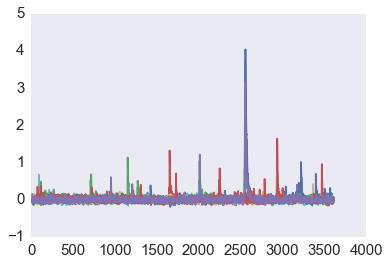

In [74]:
#plot response for one cell to all sweeps of movie
cell = 0
sweeps = nm.sweep_response[str(cell)].values
for sweep in sweeps:
    plt.plot(sweep)

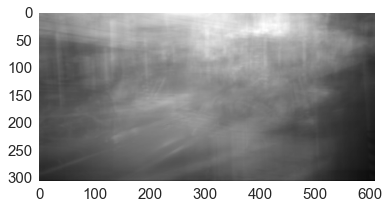

In [109]:
plt.imshow(np.mean(movie,axis=0),cmap='gray')

In [92]:
#plot response for one cell to all sweeps of movie
mean_response = []
for cell in range(nm.sweep_response.shape[1]):
    sweeps = nm.sweep_response[str(cell)].values
    mean_response.append(np.mean(sweeps,axis=0))
mean_response = np.asarray(mean_response)

(0, 252)

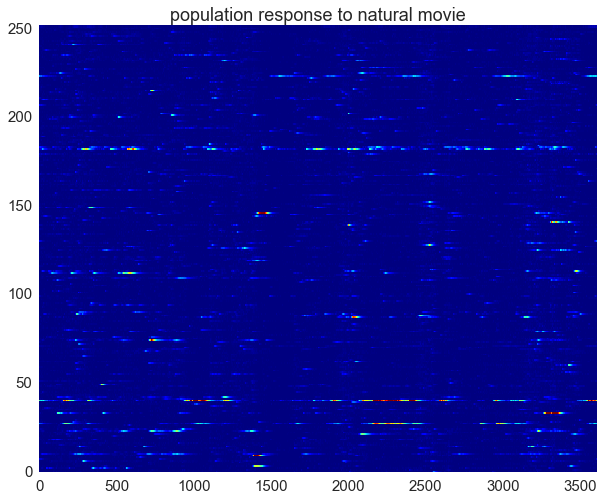

In [105]:
fix,ax=plt.subplots(figsize=(10,8))
ax.pcolormesh(mean_response,cmap='jet',vmin=0,vmax=np.max(mean_response)/2)
ax.set_title('population response to natural movie')
ax.set_xlim([0,mean_response.shape[1]])
ax.set_ylim([0,mean_response.shape[0]])

### holdover stuff from natural scenes analysis

In [82]:
# #stimulus specific analysis
# from allensdk.brain_observatory.natural_scenes import NaturalScenes
# ns = NaturalScenes(data_set)

In [53]:
#sweep_response table - dataframe of dF/F traces for every sweep (rows) for all cells (columns)
#trace includes interlength+sweeplength+interlength
sweep_response = ns.sweep_response

In [55]:
#mean_sweep_response - mean values of traces in sweep_response during stimulus window
#sweep (rows) by cells (columns)
mean_sweep_response = ns.mean_sweep_response 
mean_sweep_response.head()

,0,1,2,3,4,5,6,7,8,9,...,251,252,253,254,255,256,257,258,259,dx
0,12.418274,5.871527,5.599794,3.815869,0.526053,2.228843,6.028367,1.190621,1.674653,1.637678,...,4.048636,-13.329226,4.450078,1.508602,1.732629,3.184081,-1.651238,3.670427,4.011465,0.035566
1,3.007397,2.774787,5.359518,3.632038,7.841802,11.439992,13.729432,2.653048,5.658538,2.198213,...,1.932141,-11.852395,4.516848,3.014580,5.812439,10.940842,-1.666248,3.564546,6.499575,-0.191310
2,-3.345307,-0.579120,0.882733,-0.026673,3.049661,7.374558,11.693105,1.272825,6.266379,0.264762,...,3.115331,-11.673634,1.662271,2.039587,0.877686,15.653689,-3.988073,0.218606,57.703552,-0.158952
3,-8.496967,-1.653206,-5.240768,-2.810840,-2.951620,1.377301,-0.515395,5.196257,1.116533,-0.385984,...,-0.033214,-10.316792,-2.065676,4.824219,-5.383786,7.624096,-9.433590,-3.087440,102.370705,0.047478
4,-8.343891,-2.779307,-7.162851,-2.376591,-6.510853,-3.276185,-9.286360,3.195860,-6.714207,2.544935,...,1.025769,-5.917578,-1.153925,2.687200,-8.852141,-5.735470,-9.441893,-3.338022,8.743225,0.055797


In [56]:
#get mean response across conditions (conditions, cells, 3)
#for natural scenes, array is (#scenes, #cells, 3)
#last dimension is, for each condition: mean response, sem, p-value 
condition_response = ns.response
condition_response.shape

(119, 261, 3)

In [57]:
#mean response for all image conditions for cell 
cell = 0
mean_image_responses = condition_response[:,cell,0] #[image,cell,mean]

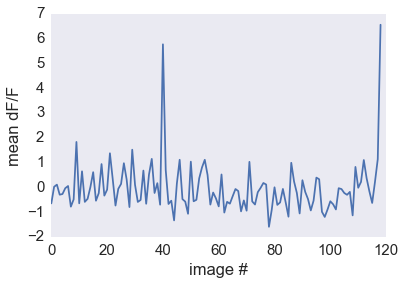

In [134]:
plt.plot(mean_image_responses)
plt.xlabel('image #')
plt.ylabel('mean dF/F')

### find pref image & plot mean response to that image

In [61]:
cell = ns.peak[ns.peak.peak_dff_ns>=3].cell_specimen_id.values[0]
cell

517488841

In [62]:
pref_scene = ns.peak[ns.peak.cell_specimen_id==cell].scene_ns.values[0]
pref_scene

117

In [63]:
pref_scene_sweeps = ns.stim_table[ns.stim_table.frame==pref_scene].index.values
pref_scene_sweeps

array([ 448,  550,  669,  691,  871,  920,  931, 1142, 1408, 1436, 1626,
       1754, 1759, 1817, 1953, 1962, 1968, 2371, 2472, 2483, 2742, 2759,
       2943, 3097, 3214, 3218, 3231, 3367, 3368, 3498, 3678, 3837, 3927,
       3980, 4209, 4404, 4411, 4455, 4581, 4721, 4742, 4904, 4960, 5112,
       5144, 5179, 5356, 5509, 5719, 5903])

In [64]:
#if the mean of the mean response to the preferred condition is > 5%
responsive_cells = ns.peak[ns.peak.peak_dff_ns>=5].cell_specimen_id.values
len(responsive_cells)

114

In [421]:
responsive_cell_id = 1

In [ ]:
responsive_cell_id = 1
cell_specimen_id = responsive_cells[responsive_cell_id]
cell_idx = np.where(ns.cell_id==cell_specimen_id)[0][0]

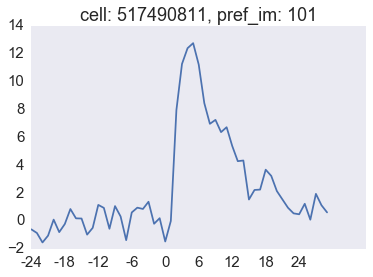

In [422]:
cell_specimen_id = responsive_cells[responsive_cell_id]
cell_idx = np.where(ns.cell_id==cell_specimen_id)[0][0]
pref_scene = ns.peak[ns.peak.cell_specimen_id==cell].scene_ns.values[0]
pref_scene_sweeps = ns.stim_table[ns.stim_table.frame==pref_scene].index.values

condition_mean = ns.sweep_response[str(cell_idx)].iloc[pref_scene_sweeps].mean()
frames = ns.sweeplength+ns.interlength*2
t = np.arange(0,frames)
t_int = np.arange(0,frames,6)
t_int_ref = t_int - ns.interlength 

fig,ax = plt.subplots()
ax.plot(t,condition_mean)
ax.set_xticks(t_int);
ax.set_xticklabels(t_int_ref);
# ax.set_xlabel('time after stimulus onset')
# ax.set_ylabel('dF/F')
ax.set_title('cell: '+str(cell)+', pref_im: '+str(pref_scene))

### make it a function & plot for all 'responsive' cells

In [423]:
ns.peak[ns.peak.cell_specimen_id==cell_specimen_id]

,scene_ns,response_reliability_ns,peak_dff_ns,ptest_ns,p_run_ns,run_modulation_ns,time_to_peak_ns,duration_ns,cell_specimen_id
6,101,20,7.48049,3.33763e-59,NaN,NaN,0.1663,0.29934,517490811


In [424]:
def plot_pref_condition_response(ns,cell_specimen_id):
    pref_scene = ns.peak[ns.peak.cell_specimen_id==cell_specimen_id].scene_ns.values[0]
    pref_scene_sweeps = ns.stim_table[ns.stim_table.frame==pref_scene].index.values
#     cell_idx = data_set.get_cell_specimen_indices([cell])[0]
    cell_idx = np.where(ns.cell_id==cell_specimen_id)[0][0]

    condition_mean = ns.sweep_response[str(cell_idx)].iloc[pref_scene_sweeps].mean()
    frames = ns.sweeplength+ns.interlength*2
    t = np.arange(0,frames)
    t_int = np.arange(0,frames,6)
    t_int_ref = t_int - ns.interlength 

    fig,ax = plt.subplots()
    ax.plot(t,condition_mean)
    ax.set_xticks(t_int);
    ax.set_xticklabels(t_int_ref/30.);
    ax.set_xlabel('time after stimulus onset')
    ax.set_ylabel('dF/F')
    ax.set_title('cell: '+str(cell)+', pref_im: '+str(pref_scene))

In [28]:
images = data_set.get_stimulus_template('natural_scenes')

In [406]:
cell_idx = np.where(ns.cell_id==cell_specimen_id)[0][0]
cell_idx

6

In [405]:
data_set.get_cell_specimen_indices([cell_specimen_id])

[6]

517490811
101
6


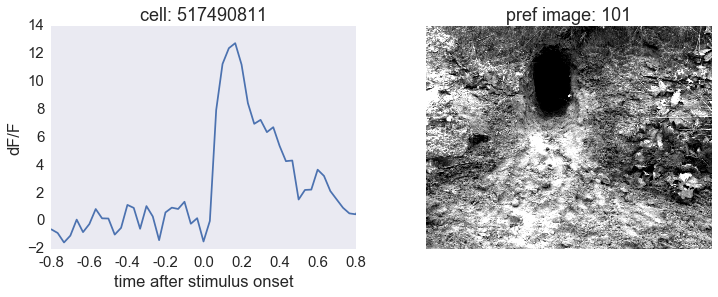

In [426]:
print cell_specimen_id
pref_scene = ns.peak[ns.peak.cell_specimen_id==cell_specimen_id].scene_ns.values[0]
print pref_scene
pref_scene_sweeps = ns.stim_table[ns.stim_table.frame==pref_scene].index.values
#     cell_idx = data_set.get_cell_specimen_indices([cell])[0]
cell_idx = np.where(ns.cell_id==cell_specimen_id)[0][0]
print cell_idx
condition_mean = ns.sweep_response[str(cell_idx)].iloc[pref_scene_sweeps].mean()
frames = ns.sweeplength+ns.interlength*2
t = np.arange(0,frames)
t_int = np.arange(0,frames,6)
t_int_ref = t_int - ns.interlength 

fig,ax = plt.subplots(1,2,figsize=(12,4))
ax = ax.ravel()
ax[0].plot(t,condition_mean)
ax[0].set_xticks(t_int);
ax[0].set_xlim([np.min(t_int),np.max(t_int)])
ax[0].set_xticklabels(t_int_ref/30.);
ax[0].set_xlabel('time after stimulus onset')
ax[0].set_ylabel('dF/F')
ax[0].set_title('cell: '+str(cell))

ax[1].imshow(images[pref_scene,:,:],cmap='gray')
ax[1].axis('off')
ax[1].set_title('pref image: '+str(pref_scene))

In [428]:
def plot_pref_condition_response(ns,cell_specimen_id,images):
    pref_scene = ns.peak[ns.peak.cell_specimen_id==cell_specimen_id].scene_ns.values[0]
    pref_scene_sweeps = ns.stim_table[ns.stim_table.frame==pref_scene].index.values
#     cell_idx = data_set.get_cell_specimen_indices([cell])[0]
    cell_idx = np.where(ns.cell_id==cell_specimen_id)[0][0]

    condition_mean = ns.sweep_response[str(cell_idx)].iloc[pref_scene_sweeps].mean()
    frames = ns.sweeplength+ns.interlength*2
    t = np.arange(0,frames)
    t_int = np.arange(0,frames,6)
    t_int_ref = t_int - ns.interlength 

    fig,ax = plt.subplots(1,2,figsize=(12,4))
    ax = ax.ravel()
    ax[0].plot(t,condition_mean)
    ax[0].set_xticks(t_int);
    ax[0].set_xlim([np.min(t_int),np.max(t_int)])
    ax[0].set_xticklabels(t_int_ref/30.);
    ax[0].set_xlabel('time after stimulus onset')
    ax[0].set_ylabel('dF/F')
    ax[0].set_title('cell: '+str(cell))
    
    ax[1].imshow(images[pref_scene,:,:],cmap='gray')
    ax[1].axis('off')
    ax[1].set_title('pref image: '+str(pref_scene))

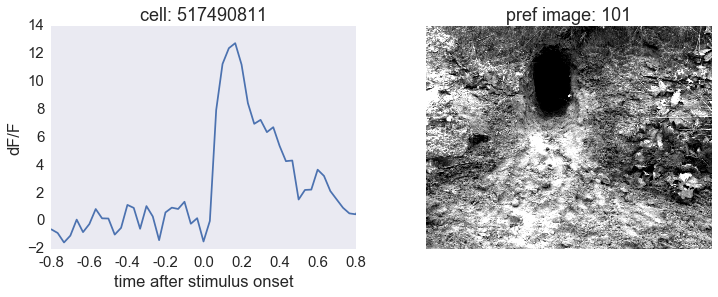

In [429]:
plot_pref_condition_response(ns,cell_specimen_id,images)

In [430]:
# for cell in responsive_cells: 
#     plot_pref_condition_response(ns,cell,images)

### get traces & image sequence for natural scenes portion of session 

In [ ]:
responsive_cell_id = 1
cell_specimen_id = responsive_cells[responsive_cell_id]
cell_idx = np.where(ns.cell_id==cell_specimen_id)[0][0]

In [437]:
timestamps,traces = data_set.get_dff_traces(cell_specimen_ids=responsive_cells)

In [438]:
frames_arr = np.empty(0)
images_arr = np.empty(0)
for sweep in range(len(stim_table)):
    start = stim_table.iloc[sweep].start
    end = stim_table.iloc[sweep].end
    frames = np.arange(start,end+1)
#     print frames.shape
    frames_arr = np.hstack((frames_arr,frames))
    image = stim_table.iloc[sweep].frame
    for i in range(len(frames)):
        images_arr = np.hstack((images_arr,image))

In [439]:
sweep = 0
start = stim_table.iloc[sweep].start
end = stim_table.iloc[sweep].end
frames = np.arange(start,end)

In [440]:
traces_arr = np.empty((traces.shape[0],frames_arr.shape[0]))
for t in range(traces.shape[0]): 
    trace = np.empty(0)
    for sweep in range(len(stim_table)):
        start = stim_table.iloc[sweep].start
        end = stim_table.iloc[sweep].end
        tmp = traces[t,start:end+1]
        trace = np.hstack((trace,tmp))
    traces_arr[t,:] = trace

In [444]:
cell_specimen_id

517490811

In [446]:
pref_scene = ns.peak[ns.peak.cell_specimen_id==cell_specimen_id].scene_ns.values[0]
pref_scene

101

In [473]:
stim_windows = []
starts = stim_table[stim_table.frame==101].start.values
ends = stim_table[stim_table.frame==101].end.values
for st,en in zip(starts,ends): 
    s = np.float(np.where(frames_arr==st)[0][0])
    e = np.float(np.where(frames_arr==en)[0][0])
    stim_windows.append([s,e])

(40000, 50000)

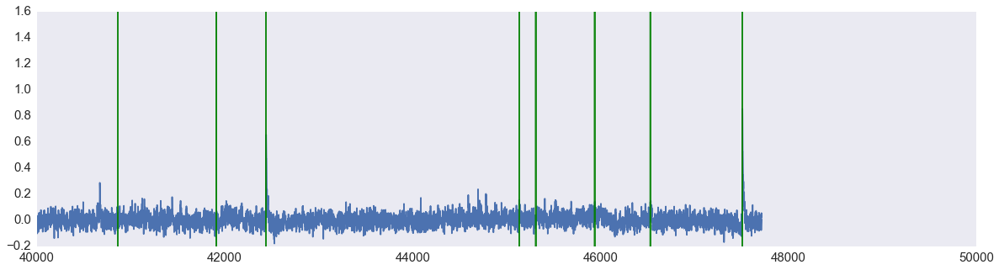

In [476]:
trace = traces_arr[responsive_cell_id,:]
fig,ax=plt.subplots(figsize=(20,5))
ax.plot(trace)
for window in stim_windows:
    frames = np.arange(window[0],window[1])
    for frame in frames:
        ax.axvline(frame,ymin=np.min(trace),ymax=np.max(trace),color='g',alpha=0.3)
ax.set_xlim([40000,50000])

(0, 10000)

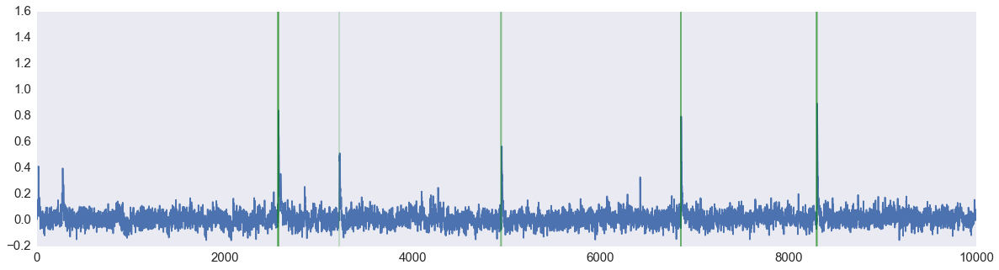

In [469]:
trace = traces_arr[responsive_cell_id,:]
fig,ax=plt.subplots(figsize=(20,5))
ax.plot(trace)
for ind in thresh_inds:
    ax.axvline(ind,ymin=np.min(trace),ymax=np.max(trace),color='g',alpha=0.2)
ax.set_xlim([0,10000])

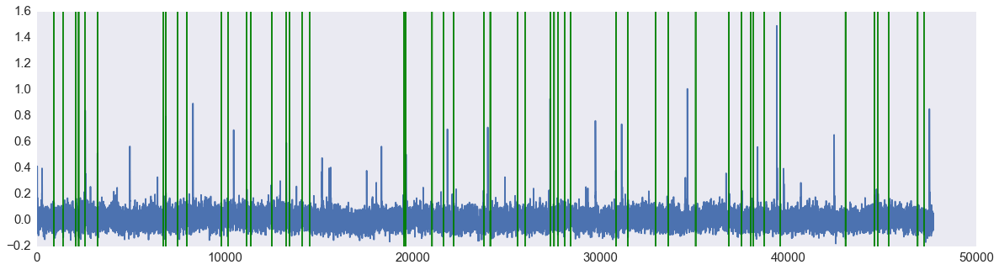

In [468]:
trace = traces_arr[responsive_cell_id,:]
fig,ax=plt.subplots(figsize=(20,5))
ax.plot(trace)
for window in stim_windows:
    frames = np.arange(window[0],window[1])
    for frame in frames:
        ax.axvline(frame,ymin=np.min(trace),ymax=np.max(trace),color='g',alpha=0.3)

In [174]:
# cell_specimen_id = responsive_cells[1]
# cell_idx = np.where(ns.cell_id==cell_specimen_id)[0][0]

In [235]:
starts = stim_table[stim_table.frame==19].start.values
ends = stim_table[stim_table.frame==19].end.values

array([16112, 16436, 16684, 16879, 16962, 17331, 18602, 19302, 20696,
       21915, 22690, 24541, 24985, 26121, 26602, 26979, 27287, 28228,
       28393, 28581, 29326, 29740, 29951, 39673, 39726, 40433, 42540,
       44368, 45158, 46242, 47792, 49936, 51042, 51125, 52652, 80690,
       82616, 85730, 85776, 87754, 87762, 87912, 88063, 88093, 90982,
       94369, 94797, 94993, 95933, 95994])

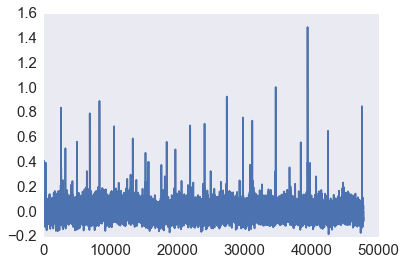

In [443]:
plt.plot(traces_arr[responsive_cell_id,:])

In [377]:
thresh_inds = np.where(traces_arr[responsive_cell_id,:]>=0.5)[0]
# thresh_inds = thresh_inds - 6

In [196]:
thresh_vals = traces_arr[cell_idx][thresh_inds]

In [197]:
thresh_images = images_arr[thresh_inds]

In [226]:
img_stack = np.empty((np.unique(thresh_images).shape[0],images[0,:,:].shape[0],images[0,:,:].shape[1]))
for i,img in enumerate(np.unique(thresh_images)):
    img_stack[i,:,:] = images[img,:,:]

/Users/marinag/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:3: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  app.launch_new_instance()


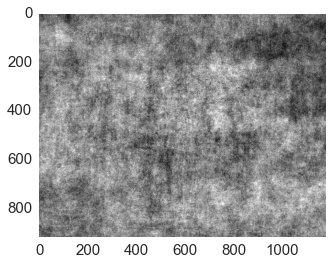

In [228]:
all_images_mean = np.mean(images,axis=0)
plt.imshow(all_images_mean,cmap='gray')

In [229]:
mean_image = np.mean(img_stack,axis=0)

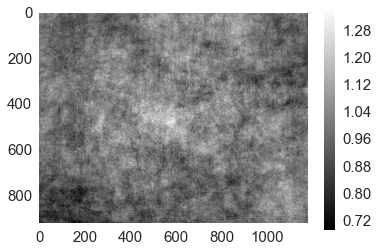

In [230]:
plt.imshow(mean_image/all_images_mean,cmap='gray')
plt.colorbar()

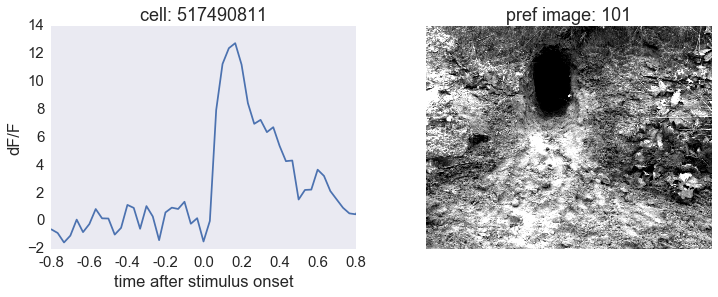

In [202]:
plot_pref_condition_response(ns,cell_specimen_id,images)

In [231]:
weighted_mean_image = np.average(img_stack,axis=0,weights=thresh_vals)

ValueError: Length of weights not compatible with specified axis.

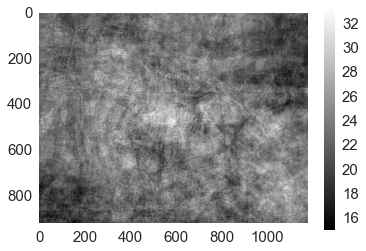

In [216]:
plt.imshow(weighted_mean_image,cmap='gray')
plt.colorbar()

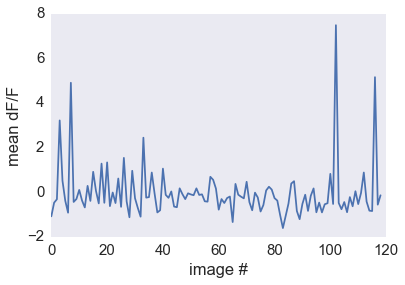

In [186]:
mean_image_responses = condition_response[:,cell_idx,0] #[image,cell,mean]
plt.plot(mean_image_responses)
plt.xlabel('image #')
plt.ylabel('mean dF/F')

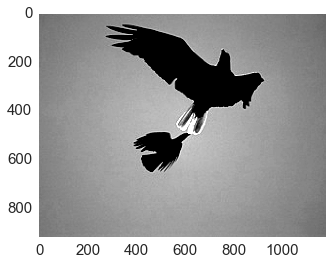

In [194]:
plt.imshow(images[19],cmap='gray')

### put it in a function and plot

In [477]:
responsive_cell_id = 1
cell_specimen_id = responsive_cells[responsive_cell_id]
cell_idx = np.where(ns.cell_id==cell_specimen_id)[0][0]
thresh = 0.5
weighted=True

/Users/marinag/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


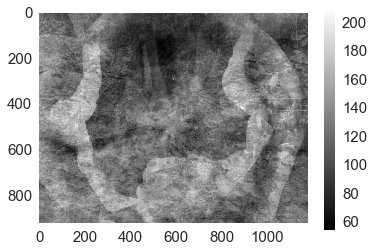

In [460]:
thresh_inds = np.where(traces_arr[responsive_cell_id,:]>=thresh)[0]
thresh_inds = thresh_inds - 6
thresh_vals = traces_arr[responsive_cell_id][thresh_inds]
thresh_images = images_arr[thresh_inds]
img_stack = np.empty((thresh_images.shape[0],images[0,:,:].shape[0],images[0,:,:].shape[1]))
for i,img in enumerate(thresh_images):
    img_stack[i,:,:] = images[img,:,:]
mean_image = np.mean(img_stack,axis=0)
plt.imshow(mean_image,cmap='gray')
plt.colorbar()

/Users/marinag/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:9: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


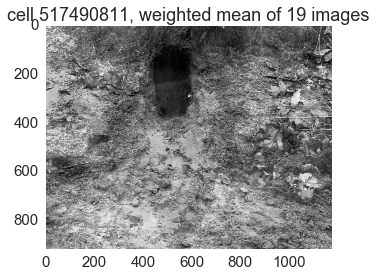

In [481]:
thresh_inds = np.where(traces_arr[responsive_cell_id,:]>=thresh)[0]
thresh_inds = thresh_inds - 6
thresh_vals = traces_arr[responsive_cell_id][thresh_inds]
thresh_images = images_arr[thresh_inds]
n_images = len(np.unique(thresh_images))

img_stack = np.empty((thresh_images.shape[0],images[0,:,:].shape[0],images[0,:,:].shape[1]))
for i,img in enumerate(thresh_images):
    img_stack[i,:,:] = images[img,:,:]
if weighted: 
    mean_image = np.average(img_stack,axis=0,weights=thresh_vals)/np.mean(images,axis=0)
else: 
    mean_image = np.mean(img_stack,axis=0)
fig,ax=plt.subplots()
ax.imshow(mean_image,cmap='gray')
if weighted:
    ax.set_title('cell '+str(cell_specimen_id)+', weighted mean of '+str(n_images)+' images')
else:
    ax.set_title('cell '+str(cell_specimen_id)+', mean of '+str(n_images)+' images')


In [162]:
def plot_mean_image(cell_specimen_id,ns,images,images_arr,traces_arr,thresh=0.3,weighted=False):
    cell_idx = np.where(ns.cell_id==cell_specimen_id)[0][0]
    thresh_inds = np.where(traces_arr[cell_idx,:]>=thresh)[0]
    thresh_inds = thresh_inds - 6
    thresh_vals = traces_arr[cell_idx][thresh_inds]
    thresh_images = images_arr[thresh_inds]
    n_images = len(np.unique(thresh_images))

    img_stack = np.empty((thresh_images.shape[0],images[0,:,:].shape[0],images[0,:,:].shape[1]))
    for i,img in enumerate(thresh_images):
        img_stack[i,:,:] = images[img,:,:]
    if weighted: 
        mean_image = np.average(img_stack,axis=0,weights=thresh_vals)
    else: 
        mean_image = np.mean(img_stack,axis=0)
    fig,ax=plt.subplots()
    ax.imshow(mean_image,cmap='gray')
    if weighted:
        ax.set_title('cell '+str(cell_specimen_id)+', weighted mean of '+str(n_images)+' images')
    else:
        ax.set_title('cell '+str(cell_specimen_id)+', mean of '+str(n_images)+' images')


In [ ]:
mean_image = np.mean(img_stack,axis=0)

/Users/marinag/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:10: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


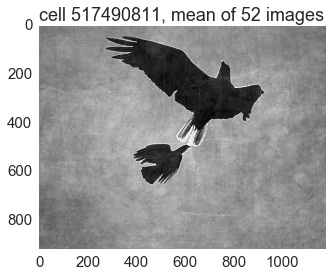

In [170]:
plot_mean_image(cell_specimen_id,ns,images,images_arr,traces_arr,thresh=0.5,weighted=False)

In [ ]:
# plot_mean_image(cell_specimen_id,ns,images,images_arr,traces_arr,thresh=0.3,weighted=True)

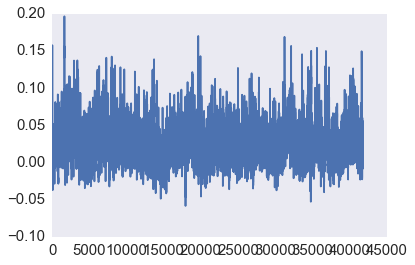

In [497]:
plt.plot(np.mean(traces_arr,axis=0))

### batch processing 

In [482]:
#processing on all traces
def get_ns_response_arrays(data_set):
    timestamps,traces = data_set.get_dff_traces(cell_specimen_ids=responsive_cells)

    frames_arr = np.empty(0)
    images_arr = np.empty(0)
    for sweep in range(len(stim_table)):
        start = stim_table.iloc[sweep].start
        end = stim_table.iloc[sweep].end
        frames = np.arange(start,end)
        frames_arr = np.hstack((frames_arr,frames))
        image = stim_table.iloc[sweep].frame
        for i in range(len(frames)):
            images_arr = np.hstack((images_arr,image))

    traces_arr = np.empty((traces.shape[0],frames_arr.shape[0]))
    for t in range(traces.shape[0]): 
        trace = np.empty(0)
        for sweep in range(len(stim_table)):
            start = stim_table.iloc[sweep].start
            end = stim_table.iloc[sweep].end
            tmp = traces[t,start:end]
            trace = np.hstack((trace,tmp))
        traces_arr[t,:] = trace

    return frames_arr, images_arr, traces_arr     

In [483]:
frames_arr, images_arr, traces_arr = get_ns_response_arrays(data_set)

In [41]:
images = data_set.get_stimulus_template('natural_scenes')

In [491]:
def plot_ns_summary(cell_specimen_id,responsive_cell_id,ns,images,frames_arr,images_arr,traces_arr,thresh=0.5,weighted=False,save_dir=False): 
    cell_idx = np.where(ns.cell_id==cell_specimen_id)[0][0] 
    
    pref_scene = ns.peak[ns.peak.cell_specimen_id==cell_specimen_id].scene_ns.values[0]
    pref_scene_sweeps = ns.stim_table[ns.stim_table.frame==pref_scene].index.values
    #     cell_idx = data_set.get_cell_specimen_indices([cell])[0]

    condition_mean = ns.sweep_response[str(cell_idx)].iloc[pref_scene_sweeps].mean()
    frames = ns.sweeplength+ns.interlength*2
    t = np.arange(0,frames)
    t_int = np.arange(0,frames,6)
    t_int_ref = t_int - ns.interlength 

    thresh_inds = np.where(traces_arr[responsive_cell_id,:]>=thresh)[0]
    thresh_inds = thresh_inds - 6
    thresh_vals = traces_arr[responsive_cell_id][thresh_inds]
    thresh_images = images_arr[thresh_inds]
    n_images = len(np.unique(thresh_images))
    img_stack = np.empty((thresh_images.shape[0],images[0,:,:].shape[0],images[0,:,:].shape[1]))
    for i,img in enumerate(thresh_images):
        img_stack[i,:,:] = images[img,:,:]
    if weighted: 
        mean_image = np.average(img_stack,axis=0,weights=thresh_vals)/np.mean(images,axis=0)
    else: 
        mean_image = np.mean(img_stack,axis=0)/np.mean(images,axis=0)

    condition_response = ns.response
    mean_image_responses = condition_response[:,cell_idx,0] #[image,cell,mean]
    
    fig,ax = plt.subplots(2,2,figsize=(15,10))
    ax = ax.ravel()
    ax[0].plot(t,condition_mean)
    ax[0].set_xticks(t_int);
    ax[0].set_xticklabels(t_int_ref/30.);
    ax[0].set_xlabel('time after stimulus onset')
    ax[0].set_ylabel('dF/F')
    ax[0].set_title('cell '+str(cell_idx)+' mean response to pref condition')

    ax[1].imshow(images[pref_scene,:,:],cmap='gray')
    ax[1].set_title('pref_im: '+str(pref_scene))
    ax[1].axis('off')

    ax[2].plot(mean_image_responses)
    ax[2].set_xlabel('image #')
    ax[2].set_ylabel('mean dF/F')
    ax[2].set_title('cell '+str(cell_specimen_id)+' normalized mean response to all conditions')

    ax[3].imshow(mean_image,cmap='gray')
    ax[3].axis('off')
    if weighted:
        ax[3].set_title('weighted mean of '+str(n_images)+' image conditions')
    else:
        ax[3].set_title('mean of '+str(n_images)+' image conditions')
    plt.tight_layout()
    if save_dir: 
        if not os.path.exists(save_dir):
            os.mkdir(save_dir)
        save_path = os.path.join(save_dir,str(cell_specimen_id)+'.png')
        fig.savefig(save_path)
    # ax[4:5].plot(traces[cell_idx,:])

In [486]:
responsive_cell_id = 1
cell_specimen_id = responsive_cells[responsive_cell_id]

/Users/marinag/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:21: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


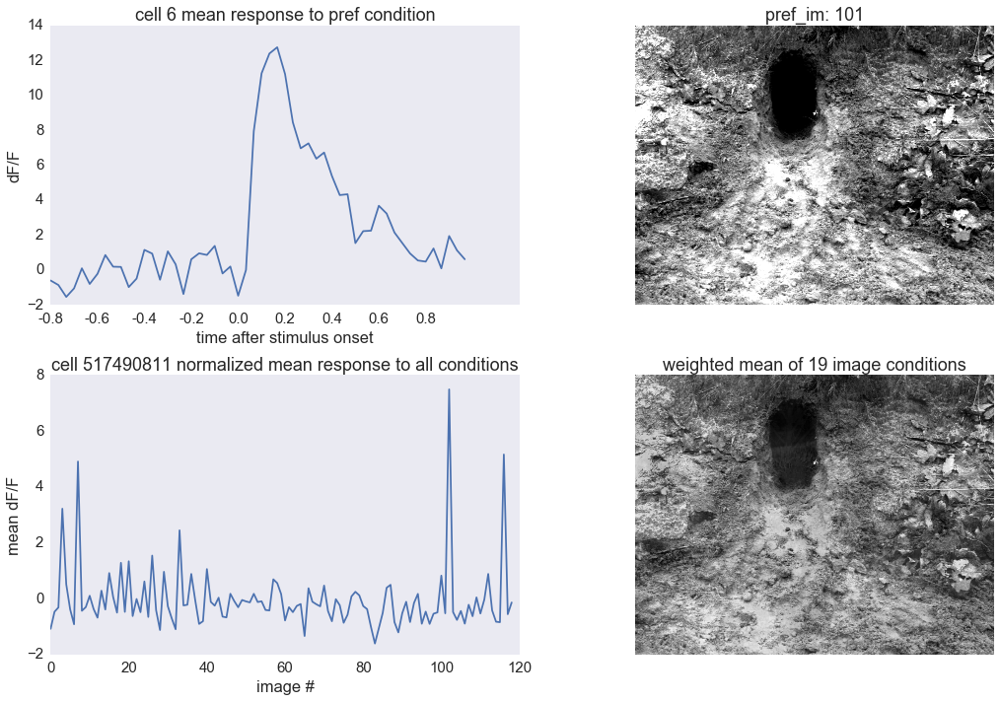

In [492]:
plot_ns_summary(cell_specimen_id,responsive_cell_id,ns,images,frames_arr,images_arr,traces_arr,thresh=0.5,weighted=True,save_dir=None)

In [495]:
responsive_cell_id

15

/Users/marinag/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:21: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


ZeroDivisionError: Weights sum to zero, can't be normalized

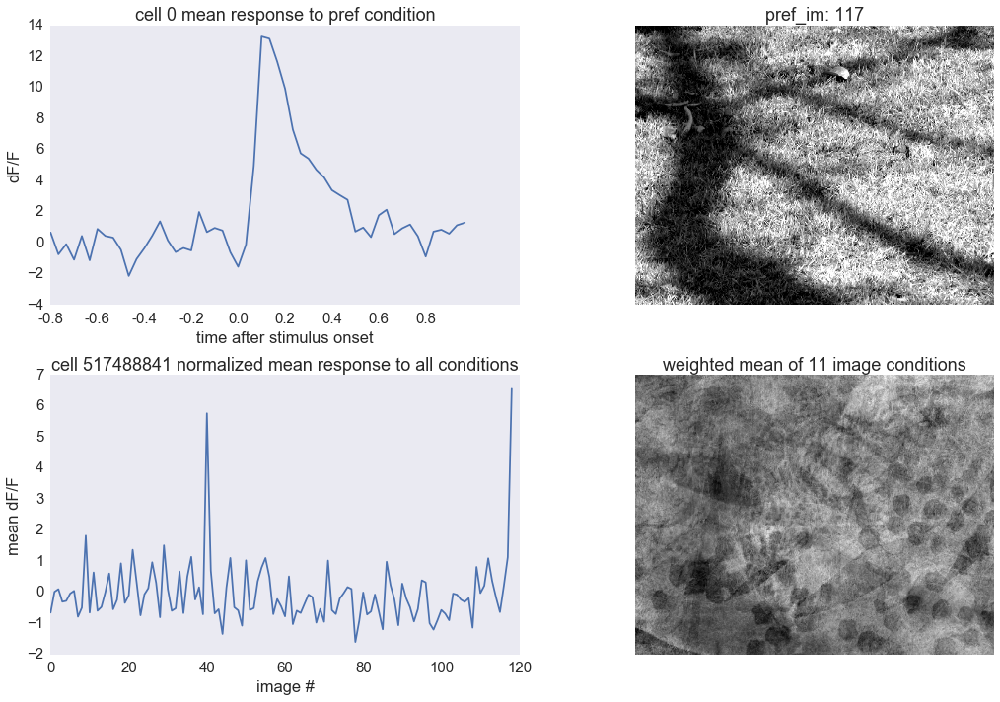

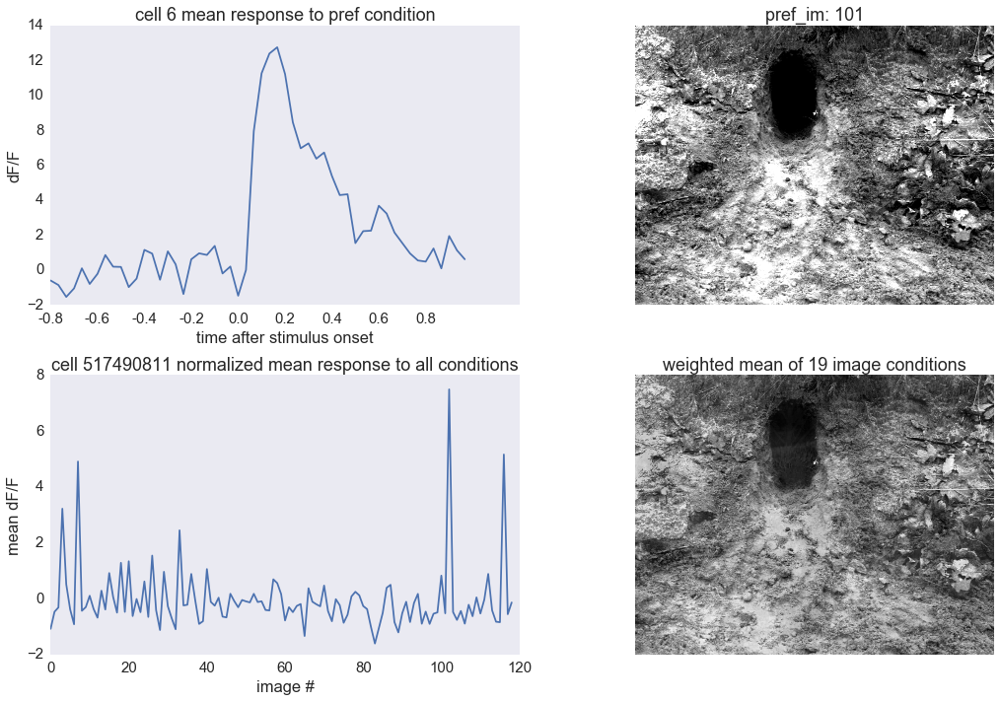

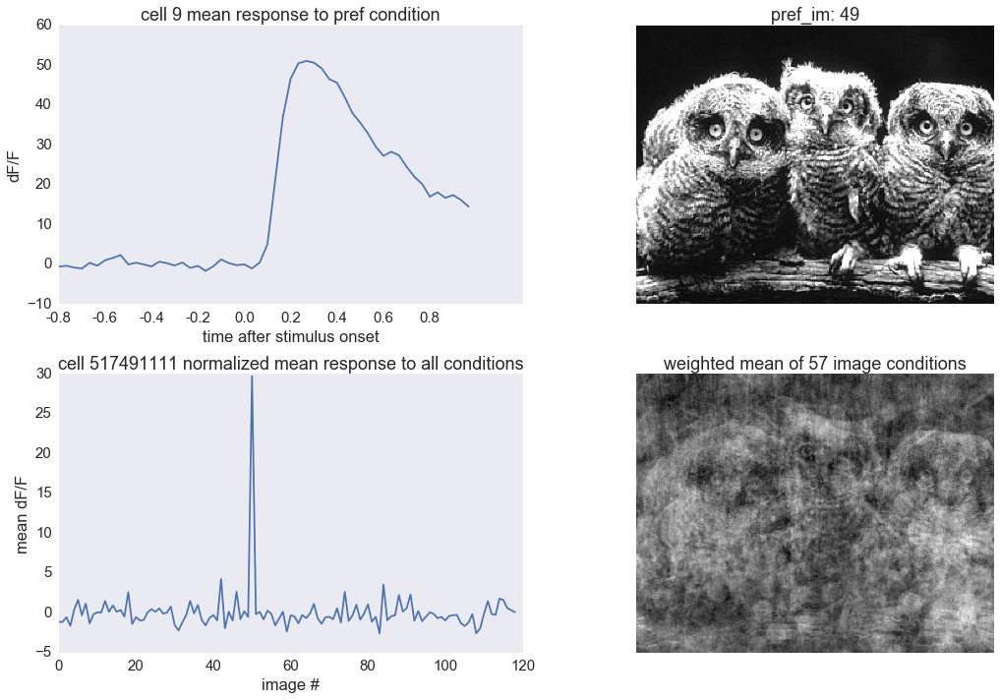

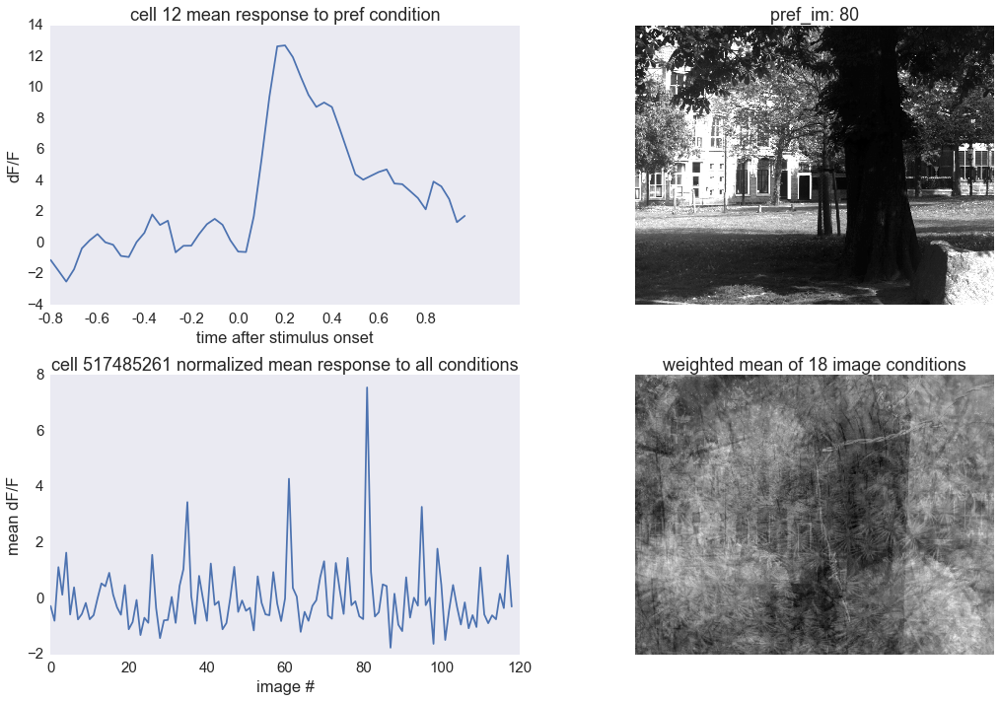

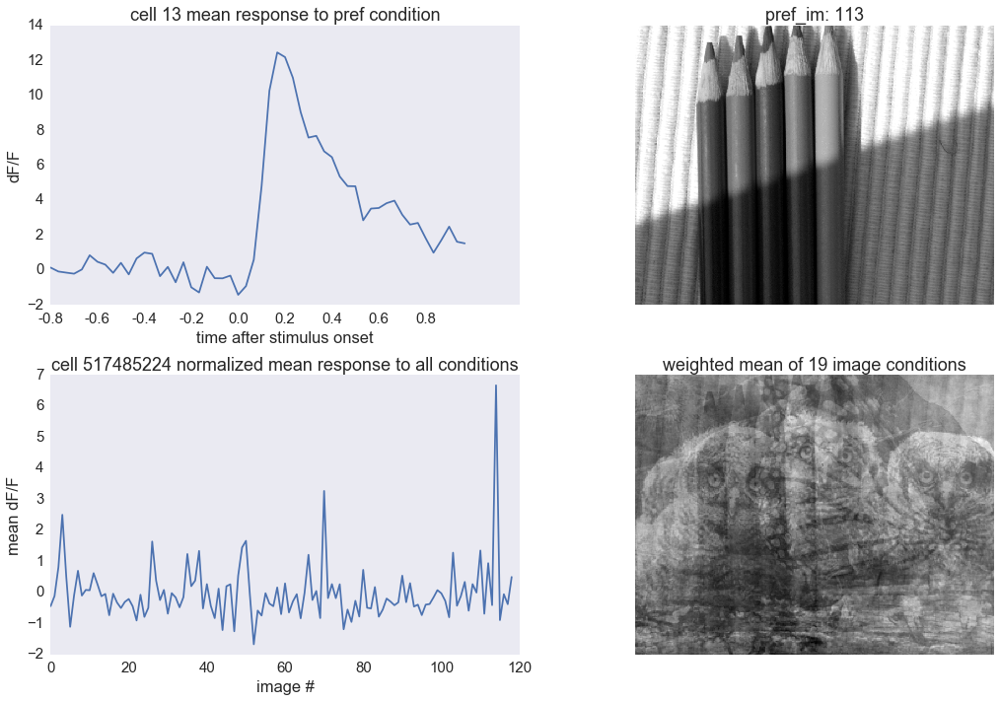

...

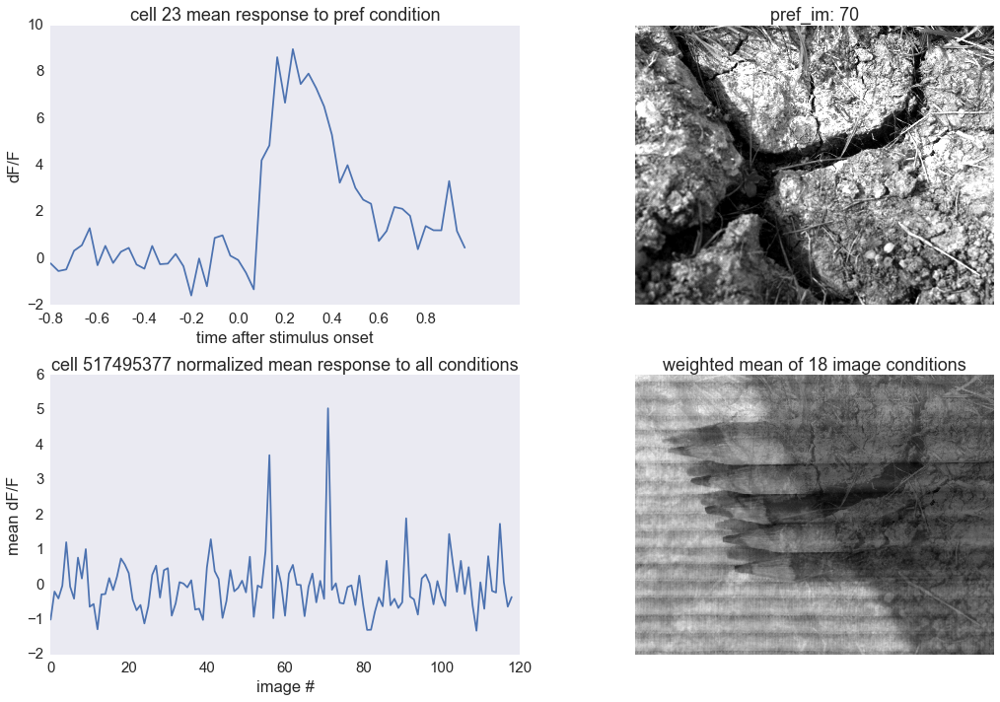

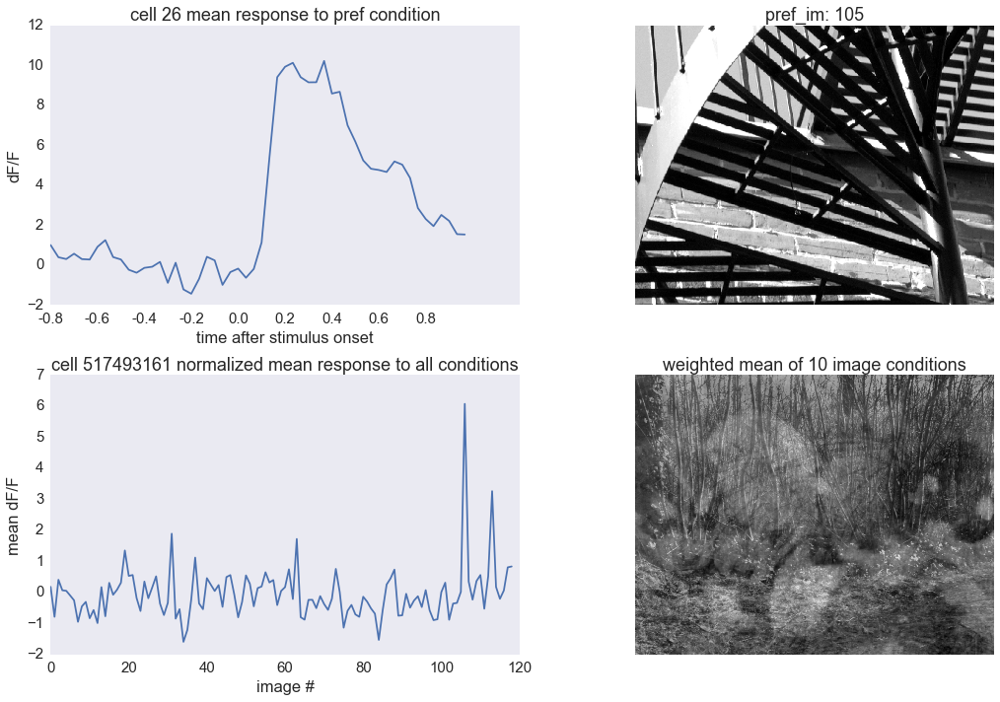

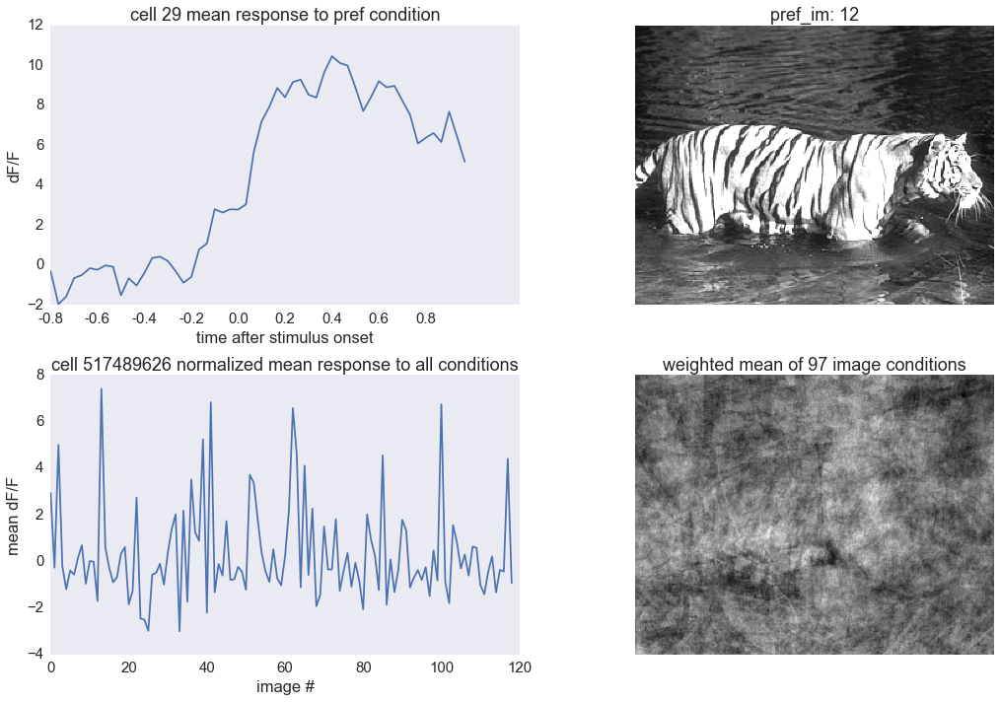

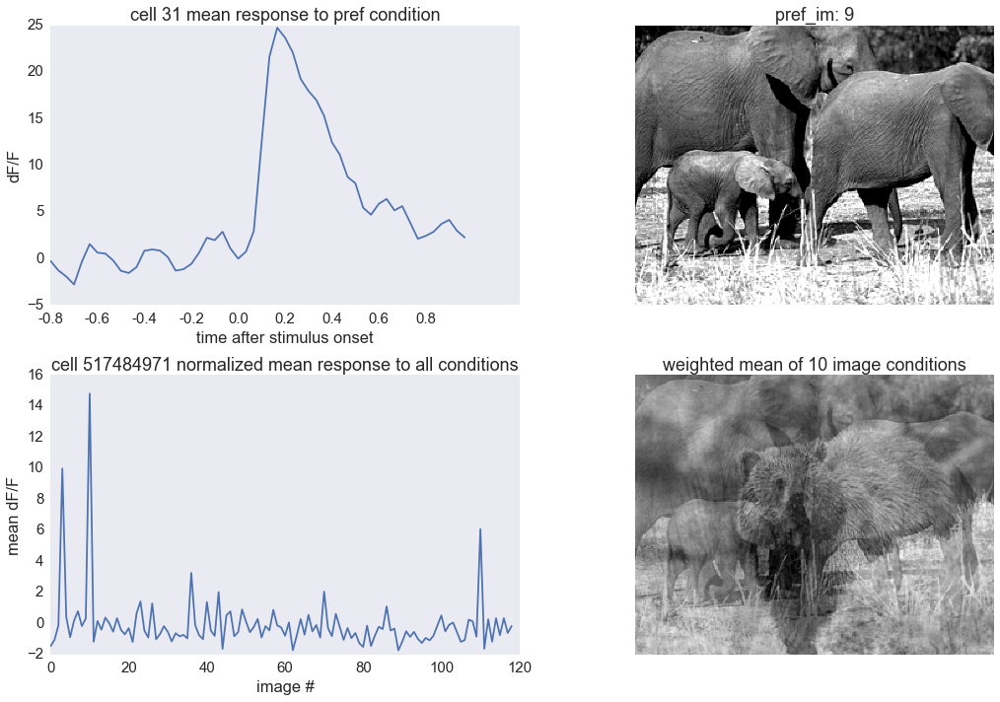

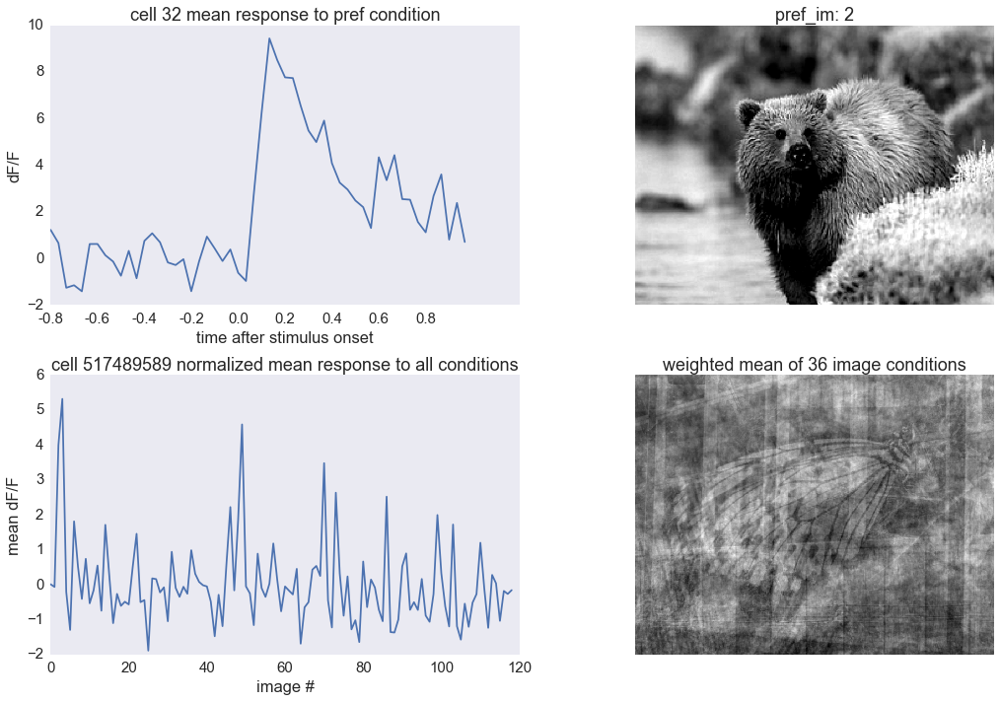

In [494]:
save_dir = os.path.join(r'/Users/marinag/Data/BrainObservatory/natural_scenes_plots/',str(session_id))
for responsive_cell_id, cell_specimen_id in enumerate(responsive_cells):
    plot_ns_summary(cell_specimen_id,responsive_cell_id,ns,images,frames_arr,images_arr,traces_arr,thresh=0.5,weighted=True,save_dir=save_dir)

/Users/marinag/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:22: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


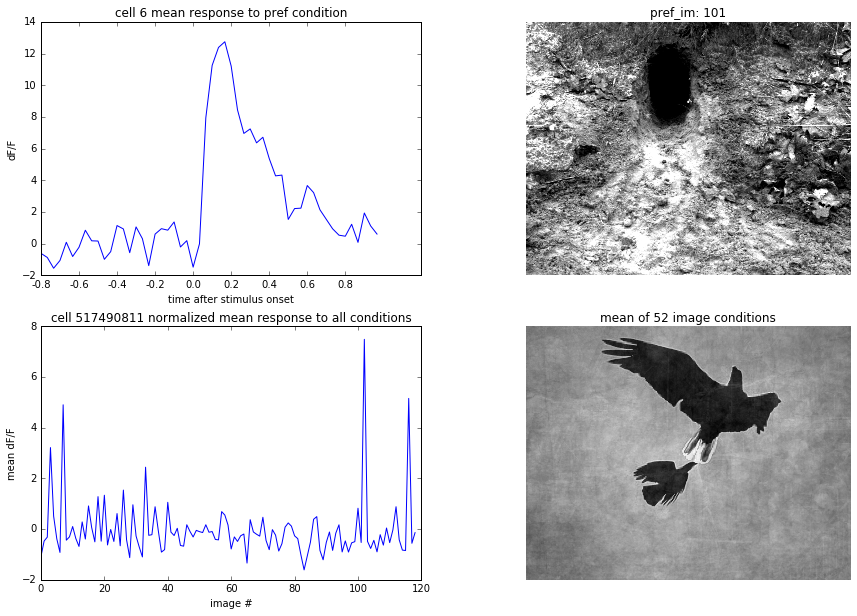

In [193]:
plot_ns_summary(responsive_cells[1],ns,images,frames_arr,images_arr,traces_arr,thresh=0.5,weighted=False)